#### Описание проекта:
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.<br>
Для начала они просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

#### Описание данных:
Файл moscow_places.csv:<br>
name — название заведения;<br>
address — адрес заведения;<br>
category — категория заведения, например «кафе», «пиццерия» или «кофейня»;<br>
hours — информация о днях и часах работы;<br>
lat — широта географической точки, в которой находится заведение;<br>
lng — долгота географической точки, в которой находится заведение;<br>
rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);<br>
price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;<br>
avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:<br>
«Средний счёт: 1000–1500 ₽»;<br>
«Цена чашки капучино: 130–220 ₽»;<br>
«Цена бокала пива: 400–600 ₽».<br>
и так далее;<br>
middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:<br>
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.<br>
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.<br>
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.<br>
middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:<br>
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.<br>
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.<br>
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.<br>
chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):<br>
0 — заведение не является сетевым<br>
1 — заведение является сетевым<br>
district — административный район, в котором находится заведение, например Центральный административный округ;<br>
seats — количество посадочных мест.<br>

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
import plotly.express as px
from folium import Map, Choropleth

In [2]:
pd.set_option('display.max_columns', 50) 
pd.set_option('display.max_rows', 500)
pd.set_option('display.float_format', lambda x: '%.5f' % x)
pd.set_option('display.max_colwidth', False)
# параметры для корректного отображения таблиц и более удобного их анализа

In [3]:
df = pd.read_csv(r'https://code.s3.yandex.net/datasets/moscow_places.csv', sep=",")

In [4]:
def info(df):
    display(df.head())
    display(df.info())
    display(df.isna().sum())
    display(df.duplicated().sum())

### Предподготовка данных

In [5]:
info(df)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.87849,37.47886,5.00000,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.87580,37.48448,4.50000,выше среднего,Средний счёт:1500–1600 ₽,1550.00000,NaN,0,4.00000
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.88915,37.52590,4.60000,средние,Средний счёт:от 1000 ₽,1000.00000,NaN,0,45.00000
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88161,37.48886,5.00000,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00000,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88117,37.44936,5.00000,средние,Средний счёт:400–600 ₽,500.00000,NaN,1,148.00000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

name                 0   
category             0   
address              0   
district             0   
hours                536 
lat                  0   
lng                  0   
rating               0   
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                0   
seats                3611
dtype: int64

0

In [6]:
# Приводим столбец 'name' к универсальному виду, для обработки дубликатов
df['name'] = df['name'].str.lower() 
df['name'] = df['name'].str.strip() 
df['name'] = df['name'].str.replace('ё', 'е')

In [7]:
# Избавляемся от дубликатов 
df = df.drop_duplicates(subset=['name', 'address'], keep='first')

In [8]:
# Добавляем столбец с названием улиц
df['street'] = df.apply(lambda x: x['address'].split(', ')[1], axis = 1)

In [9]:
# Добавляем столбец с значением, что заведение работает ежедневно и круглосуточно
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')

### Анализ данных

#### Исследуем количество объектов общественного питания по категориям

In [10]:
cat = df.pivot_table(index='category', values='name', aggfunc='count').reset_index()
colors = sns.color_palette('muted')

In [11]:
cat

,category,name
0,"бар,паб",764
1,булочная,256
2,быстрое питание,603
3,кафе,2377
4,кофейня,1413
5,пиццерия,633
6,ресторан,2042
7,столовая,315


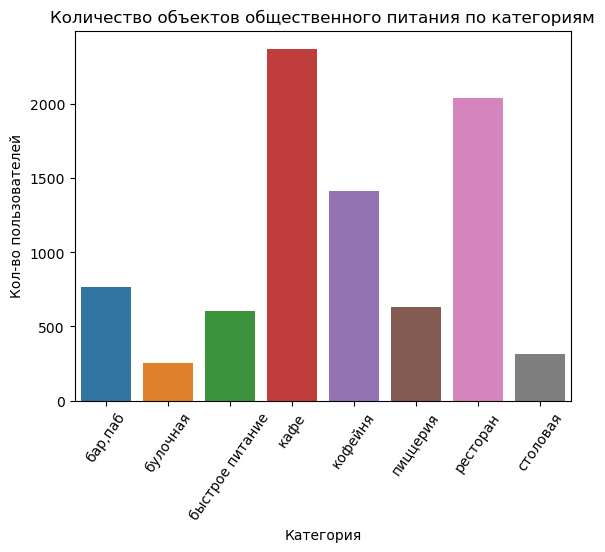

In [12]:
# Строим столбчатую диаграмму по количеству пользователей заведений
sns.barplot(data= cat, x='category', y='name').set(ylabel='Кол-во пользователей', xlabel='Категория')
plt.xticks(rotation=55)
plt.title("Количество объектов общественного питания по категориям");

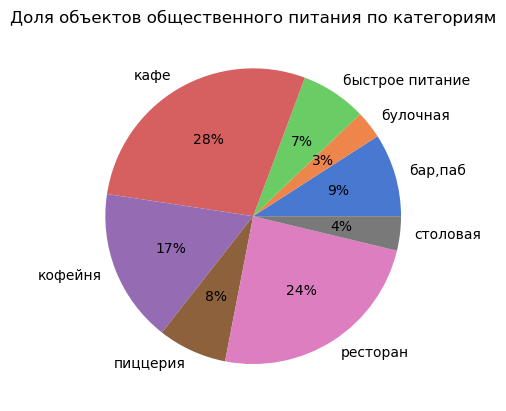

In [13]:
# строим круговую диаграмму, для определения долей по заведениям
colors = sns.color_palette('muted')
plt.pie(cat['name'], labels=cat['category'], colors = colors, autopct='%.0f%%')
plt.title("Доля объектов общественного питания по категориям");

Больше всего в Москве кафе и ресторанов, чуть меньше кофеен. Остальные виды заведений распределены примерно одинаково. Меньше всего булочных и столовых, так как они, как правило, располагаются рядом с жилыми кварталами и предприятиями, а все остальные типы меньше привязаны к локации.

#### Исследуем количество посадочных мест в местах по категориям

In [14]:
category_order = df.groupby('category').agg({'seats': lambda x: round(x.median())}).sort_values('seats', ascending=False).index
fig = px.box(df, y='seats', x='category', color='category', width=900, height=600)
fig.update_xaxes(tickangle=30, categoryorder='array', categoryarray=category_order)
fig.update_layout(xaxis_title='Распределение посадочных мест по категориямм заведений',
                  yaxis_title='количество')
fig.show()

Больше всего посадочных мест в ресторанах и барах/пабах. В барах очень часто заявленных мест больше, чем фактических, также в барах существуют стойки. Рестораны отличаются большими помещениями и являются самыми крупными заведениями общественного питания. Меньше всего посадочных мест в булочных, поскольку, многие представляют собой магазин с выпечкой, где присутсвует пара столиков.

#### Изобразим соотношение сетевых и несетевых заведений в датасете

In [15]:
count_chain = df.groupby(by='category')['chain'].count()
sum__chained = df.groupby(by='category')['chain'].sum()
mean_chain = ((count_chain / sum__chained) * 100).reset_index()

In [16]:
mean_chain

,category,chain
0,"бар,паб",454.76190
1,булочная,163.05732
2,быстрое питание,259.91379
3,кафе,305.13479
4,кофейня,196.25000
5,пиццерия,191.81818
6,ресторан,280.10974
7,столовая,357.95455


Text(0.5, 1.0, 'Доля сетевых объектов от общего количества объектов каждой категории')

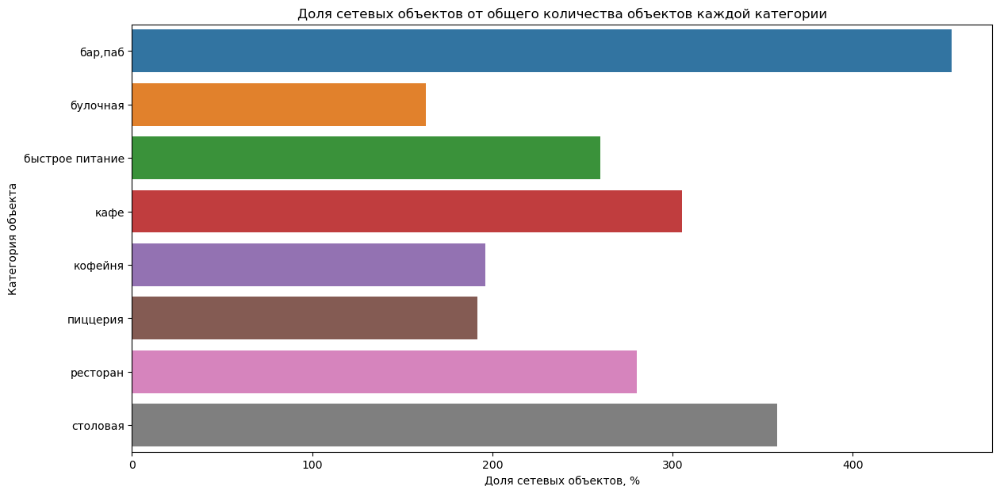

In [17]:
plt.figure(figsize=(14, 7)) # Размер графика
sns.barplot(data = mean_chain, x='chain', y='category').set(ylabel='Категория объекта', xlabel='Доля сетевых объектов, %')
plt.title('Доля сетевых объектов от общего количества объектов каждой категории') # Название графика

Больше всего сетевых заведений представлено барами/пабами, поскольку даже два заведения, уже сеть. Баров очень много, бывает, что один и тот же бар представлен в двух соседних зданиях, потому что для одного не хватило места и стало проще открыть еще один. Также бары очень часто крайне маленькие, и могут быть представлены большим количеством разных названий на малой площади. <br>
Следующей по доле идет столовая, их просто проще открывать в больших количествах недалеко от предприятий и учебных заведений. Нет возможности выделиться, поэтому открывать одиночные столовые невыгодно. <br>
Кафе и рестораны представлены одинаковой долей. поскольку это две самых популярных категории заведений в принципе для людей и выгодно открывать сети, чтобы быть узнаваемыми в городе

#### Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве

In [18]:
top15 = df.query('chain == 1')
top15 = top15.pivot_table(index='name', columns='category', values='district', aggfunc='count').fillna(0)
top15['total'] = top15.sum(axis=1)
top15 = top15.sort_values(by='total', ascending=False).reset_index()
top15 = top15.drop(columns='total')
top15 = top15.iloc[:15]

In [19]:
fig = px.bar(top15,
            x= top15.columns,
            y= top15['name'],
            title="Топ-15 сетевых заведений Москвы по количеству")
fig.update_layout(xaxis_title='Количество заведений',
                  yaxis_title='Название сетевого заведения',
                  yaxis={'categoryorder': 'total ascending'})
fig.show()

Самое популярное сетевое заведение "Шоколадница", которое представлено в категории кофейня и присутствует повсеместно в Москве. Дальше две сети пиццерий, две кофейни формата "coffee to go", которые удобно расположены всегда на пути жителей. В итоге в топ-15 большинство это удобные для людей заведения, которые представляют быстрый сервис и являются узнаваемыми по всему городу.

#### Отобразим общее количество заведений и количество заведений каждой категории по районам

In [20]:
districts_sum = df.groupby(['district', 'category'])['name'].agg({'count'}).sort_values(by='count', ascending=False).reset_index()
fig = px.bar(districts_sum,
            x= districts_sum['district'],
            y= districts_sum['count'],
            color="category",
            title="Общее количество заведений и количество по категориям в округах")
fig.update_layout(xaxis_title='Район', yaxis_title='Количество заведений')
fig.show()

Самое большое количество заведений в Центральном АО (больше, чем в 2 раза, чем в любом другом округе). Все остальные округа имеют приблизительно равные по количеству заведений цифры, за исключением СЗАО, там чуть меньше. <br>
    Соотношение заведений по районам примерно равное: Преобладают рестораны и кафе. В Центральном округе стоит отметить в равной доли с первыми двумя категориями выделяются кофейни и бары, когда в других округах их значительно меньше. 

#### Визуализируем распределение средних рейтингов по категориям заведений

In [21]:
cat_mean = df.groupby(['category'])['rating'].agg({'mean'}).sort_values(by='mean', ascending=False).reset_index()
cat_mean

,category,mean
0,"бар,паб",4.38770
1,пиццерия,4.30126
2,ресторан,4.29040
3,кофейня,4.27728
4,булочная,4.26836
5,столовая,4.21143
6,кафе,4.12390
7,быстрое питание,4.05025


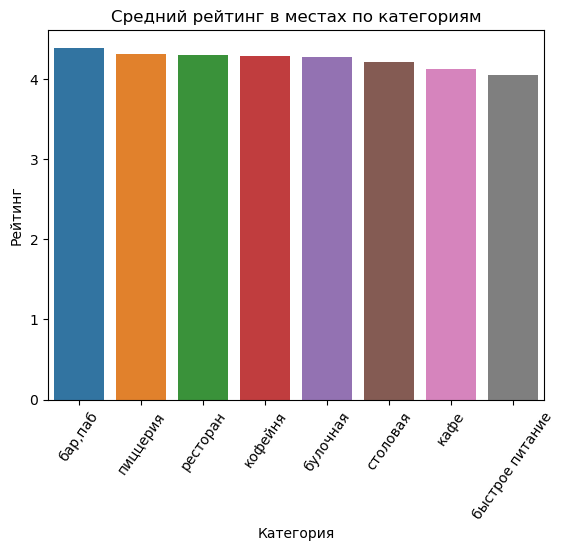

In [22]:
sns.barplot(data = cat_mean, x='category', y='mean').set(ylabel='Рейтинг', xlabel='Категория')
plt.xticks(rotation=55)
plt.title("Средний рейтинг в местах по категориям");

Рейтинг по категориям заведений не сильно изменяется, стоит только отметить, что в барах/пабах самый высокий рейтинг, а в заведениях быстрого питания самый низкий, что связано с настроением людей, которые туда приходят и с внешней атмосферой.

#### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [23]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df

,district,rating
0,Восточный административный округ,4.17419
1,Западный административный округ,4.18165
2,Северный административный округ,4.23982
3,Северо-Восточный административный округ,4.14798
4,Северо-Западный административный округ,4.20880
5,Центральный административный округ,4.37752
6,Юго-Восточный административный округ,4.10112
7,Юго-Западный административный округ,4.17292
8,Южный административный округ,4.18442


##### Фоновая картограмма со средним рейтингом заведений каждого округа

In [24]:
from folium import Map, Choropleth
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий рейтинг у заведений в Центральном округе Москвы, что связано с большой концентрацией хороших заведений в нем, а также с большим количеством туристов, которые могут ставить оценки выше из-за хорошего настроения в отпуске

##### Хороплет со всеми заведениями датасета

In [25]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

#### Найдем топ-15 улиц по количеству заведений

In [26]:
top_str = df.pivot_table(index='street', columns='category', values='name', aggfunc='count').fillna(0)
top_str['total'] = top_str.sum(axis=1)
top_str = top_str.sort_values(by='total', ascending=False).reset_index()
top_str = top_str.drop(columns='total')
top_str = top_str.iloc[:15]
top_str

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,проспект Мира,11.00000,4.00000,21.00000,53.00000,36.00000,11.00000,45.00000,2.00000
1,Профсоюзная улица,6.00000,4.00000,15.00000,35.00000,18.00000,15.00000,26.00000,3.00000
2,проспект Вернадского,7.00000,1.00000,12.00000,25.00000,16.00000,12.00000,33.00000,2.00000
3,Ленинский проспект,10.00000,3.00000,2.00000,26.00000,23.00000,5.00000,33.00000,5.00000
4,Ленинградский проспект,15.00000,4.00000,2.00000,12.00000,25.00000,9.00000,25.00000,3.00000
5,Дмитровское шоссе,6.00000,2.00000,10.00000,23.00000,11.00000,8.00000,24.00000,4.00000
6,Каширское шоссе,2.00000,0.00000,10.00000,20.00000,16.00000,5.00000,19.00000,5.00000
7,Варшавское шоссе,6.00000,0.00000,7.00000,18.00000,14.00000,4.00000,20.00000,7.00000
8,Ленинградское шоссе,5.00000,2.00000,5.00000,13.00000,13.00000,3.00000,26.00000,3.00000
9,МКАД,1.00000,0.00000,9.00000,45.00000,4.00000,0.00000,5.00000,1.00000


In [27]:
fig = px.bar(top_str,
            x= top_str.columns,
            y= top_str['street'],
            title="Топ-15 улиц Москвы по количеству заведений")
fig.update_layout(yaxis_title='Название улицы',
                  xaxis_title='Количество заведений',
                  yaxis={'categoryorder': 'total ascending'})
fig.show()

Самой "ресторанной" улицей Москвы можно с отрывом назвать проспект Мира просто потому что он пересекает половину города. <br>
В принципе, если проанализировать, самые наполненные заведениями, улицы, то можно сделать вывод, что это все крупные проспекты или шоссе, уходящие на окраину, но являющиеся сильно протяженными.

Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [28]:
all_streets = df.groupby(['street' ]).agg(cnt_venues_on_street= ('name', 'count')).sort_values(by= 'cnt_venues_on_street', ascending=False).reset_index()
street_category = df.groupby(['street','category']).agg(cnt_venues_by_category_on_street=('name', 'count')).reset_index()
all_streets = all_streets.merge(street_category, on='street', how='left') 
all_streets = all_streets.query('cnt_venues_on_street ==1')
all_streets

,street,cnt_venues_on_street,category,cnt_venues_by_category_on_street
3364,улица Фотиевой,1,столовая,1
3365,улица Фадеева,1,кофейня,1
3366,улица Кирпичные Выемки,1,кафе,1
3367,сад Эрмитаж,1,быстрое питание,1
3368,улица Ивана Франко,1,ресторан,1
3369,улица Капотня,1,быстрое питание,1
3370,улица Шухова,1,ресторан,1
3371,улица Ильинка,1,ресторан,1
3372,улица Юннатов,1,столовая,1
3373,улица Академика Комарова,1,кафе,1


In [29]:
horo_df_raw = df.drop(columns='address') # убираем столбец с адресом, чтобы присоеденить датафреймы 

In [30]:
# убираем столбец с адресом, чтобы присоеденить датафреймы(в одном address - int, в другом object)
horo_df_raw = df.drop(columns='address')
# соединяем таблицы для получения широты и долготы и последующей визуализации на карте
horo_df_ready = all_streets.merge(horo_df_raw, how = 'left', left_on='street', right_on='street')
horo_df_ready 

,street,cnt_venues_on_street,category_x,cnt_venues_by_category_on_street,name,category_y,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24_7
0,улица Фотиевой,1,столовая,1,кафе,столовая,Юго-Западный административный округ,пн-пт 08:00–17:00,55.70189,37.56151,4.10000,NaN,Средний счёт:300–400 ₽,350.00000,NaN,0,NaN,False
1,улица Фадеева,1,кофейня,1,просвет,кофейня,Центральный административный округ,"ежедневно, 08:00–23:00",55.77580,37.59674,4.60000,NaN,Цена чашки капучино:200–300 ₽,NaN,250.00000,0,NaN,False
2,улица Кирпичные Выемки,1,кафе,1,чайная,кафе,Южный административный округ,пн-пт 09:00–18:00,55.58698,37.60122,4.10000,средние,Средний счёт:300–500 ₽,400.00000,NaN,1,21.00000,False
3,сад Эрмитаж,1,быстрое питание,1,лаки сувлаки,быстрое питание,Центральный административный округ,"ежедневно, 11:00–23:00",55.77029,37.61006,4.30000,средние,Средний счёт:700–1000 ₽,850.00000,NaN,1,NaN,False
4,улица Ивана Франко,1,ресторан,1,кафе арбат,ресторан,Западный административный округ,пн-пт 13:00–15:00,55.72809,37.44239,4.30000,средние,Средний счёт:200–350 ₽,275.00000,NaN,0,40.00000,False
5,улица Капотня,1,быстрое питание,1,саят-нова,быстрое питание,Юго-Восточный административный округ,пн-чт 11:00–00:00; пт-вс 11:00–01:00,55.64010,37.80850,4.40000,высокие,Средний счёт:2000–3500 ₽,2750.00000,NaN,0,220.00000,False
6,улица Шухова,1,ресторан,1,scirocco,ресторан,Южный административный округ,"ежедневно, 12:00–00:00",55.71612,37.60847,4.10000,высокие,Средний счёт:2500–3500 ₽,3000.00000,NaN,0,90.00000,False
7,улица Ильинка,1,ресторан,1,тейст,ресторан,Центральный административный округ,"ежедневно, 12:00–00:00",55.75459,37.62467,4.40000,NaN,NaN,NaN,NaN,0,NaN,False
8,улица Юннатов,1,столовая,1,кафе-столовая,столовая,Северный административный округ,пн-пт 08:30–17:30,55.80261,37.55876,4.70000,средние,Средний счёт:250–400 ₽,325.00000,NaN,0,27.00000,False
9,улица Академика Комарова,1,кафе,1,ля фантази,кафе,Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.82924,37.59967,4.20000,NaN,NaN,NaN,NaN,1,NaN,False


Text(0.5, 1.0, 'Количество заведений по категориям, являющихся единственными на улице')

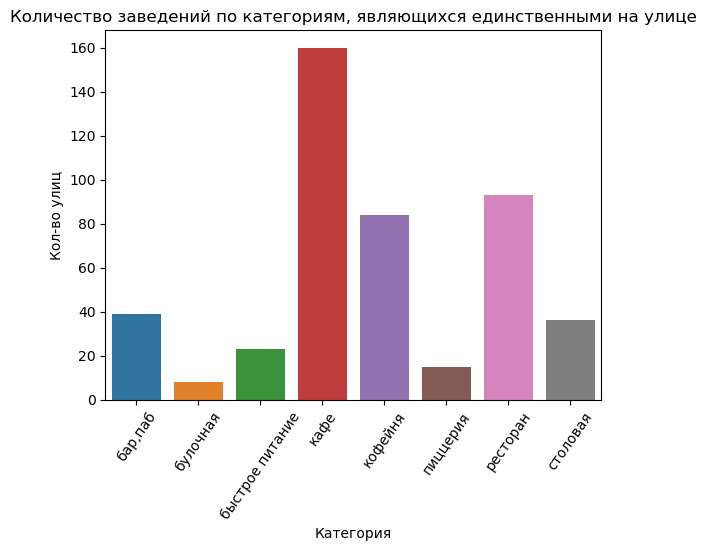

In [31]:
solo_street_plot = horo_df_ready.pivot_table(index='category_x', values='name', aggfunc='count').reset_index()

sns.barplot(data=solo_street_plot, x='category_x', y='name').set(ylabel='Кол-во улиц', xlabel='Категория')
plt.xticks(rotation=55)
plt.title('Количество заведений по категориям, являющихся единственными на улице')

##### Хороплет с улицами, на которых находится только один объект общепита

In [32]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
horo_df_ready.apply(create_clusters, axis=1)

# выводим карту
m

Заведения, которые являются единственными на улице, присутствуют по всему городу. В основном, это маленькие переулки, либо промзоны. Большинство одиночностоящих заведений представлены кафе, ресторанами, кофейнями, барами и столовыми. В основном, это заведения для местных жителей, либо заведения при предприятиях.

#### Проанализируем цены в центральном административном округе и других

In [33]:
median_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
median_df

,district,middle_avg_bill
0,Восточный административный округ,575.00000
1,Западный административный округ,1000.00000
2,Северный административный округ,650.00000
3,Северо-Восточный административный округ,500.00000
4,Северо-Западный административный округ,700.00000
5,Центральный административный округ,1000.00000
6,Юго-Восточный административный округ,450.00000
7,Юго-Западный административный округ,600.00000
8,Южный административный округ,500.00000


In [34]:
from folium import Map, Choropleth
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Средний чек по округам',
).add_to(m)

# выводим карту
m

Изменение среднего чека по округам города Москвы имеет западную направленность, два округа -- Центральный и Западный имеют стоимость среднего чека 1000р. Центральный район является туристическим, а также включает в себя огромное количество заведений(включая бары), что приводит к высокому значению среднего чека. На счет Западного округа, возможно, высокие цены связаны с тем, что в него входит достаточное количество достопримечательностей(парков, спортивных объектов), чтобы привлекать туда достаточное количество туристов, которые не скупятся при заказе. <br>
Остальные округи имеют приблизительно равные значения среднего чека в диапазоне 450-650р.

### ВЫВОД <br>
Самым наполненным заведениями, является Центральный округ. В нем немного другие закономерности, а также средние цены. Если на окраинах города баров практически нет, то в центре их количество сопоставимо с ресторанами и кофейнями. <br>
Больше всего заведений представлены кафе, ресторанами и кофейнями. <br>
Одиночные заведения, как правило, являются кафе и располагаются на маленьких улицах, либо в промзонах и парках <br>


### Детализируем исследование: открытие кофейни

#### Об исследовании:
Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

#### Посмотрим в каких районах больше всего кофеен и каковы особенности их расположения

In [35]:
coffee = df.query('category=="кофейня"')

In [36]:
coff_m = coffee.groupby('district', as_index=False)['name'].agg('count')
coff_m.sort_values(by='name', ascending=False)

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


#### Хитмэп с распределением кофеен по районам

In [37]:
from folium import Map, Choropleth
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coff_m,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Распределение кофеен по районам',
).add_to(m)

# выводим карту
m

#### Хорроплет с расположением кофеен по городу

In [38]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee.apply(create_clusters, axis=1)

# выводим карту
m

Кофейни есть везде по городу, а, особенно, они есть в центральном округе и немного поодаль, в пределах третьего кольца. На окраинах их также достаточно, но распределены они достаточно редко, в основном, привязываясь к каким-либо местам интереса.

#### Узнаем есть ли круглосуточные кофейни

In [39]:
coffee.is_24_7.value_counts()

False    1339
True     59  
Name: is_24_7, dtype: int64

Из 1398 кофеен в Москве, 59 из них работают круглосуточно. Они существуют, но их крайне мало

#### Узнаем какие у кофеен рейтинги и как они распределяются по районам

In [40]:
rating_cf = coffee.groupby('district', as_index=False)['rating'].agg('mean')
rating_cf

,district,rating
0,Восточный административный округ,4.28286
1,Западный административный округ,4.19533
2,Северный административный округ,4.29171
3,Северо-Восточный административный округ,4.21698
4,Северо-Западный административный округ,4.32581
5,Центральный административный округ,4.33645
6,Юго-Восточный административный округ,4.22584
7,Юго-Западный административный округ,4.28333
8,Южный административный округ,4.23282


Рейтинг кофеен никак не зависит от их местоположения и имеет приблизительно равные значения

#### Узнаем на какую стоимость чашки капучино стоит ориентироваться при открытии

In [41]:
cup_m = coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
cup_m.sort_values(by='middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.00000
5,Центральный административный округ,190.00000
1,Западный административный округ,189.00000
4,Северо-Западный административный округ,165.00000
3,Северо-Восточный административный округ,162.50000
2,Северный административный округ,159.00000
8,Южный административный округ,150.00000
6,Юго-Восточный административный округ,147.50000
0,Восточный административный округ,135.00000


In [42]:
from folium import Map, Choropleth
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_m,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    line_opacity=0.5,
    legend_name='Средняя стоимость чашки капучино',
).add_to(m)

# выводим карту
m

Самая дорогая чашка капучино будет в центре города(практически 200 рублей), а также не сильно дешевле будет в Западном и Юго-Западном округах Москвы. <br>
Соответственно, при открытии кофейни, стоит ориентироваться на средние значения по округам, и делать немного ниже, чтобы иметь преимущество. В разных частях города, разные цены. При желании открыть кофейню в Битцевском парке, можно поставить средний ценник выше, нежели кофейня была бы открыта в Измайловском лесопарке.

#### Рекомендация к открытию кофейни <br>
Выгодно открывать кофейню ближе к центру, либо около/на территории туристических мест, либо мест отдыха. К сожалению, данная ниша практически полностью закрыта, и раскрутиться при такой высокой конкуренции будет крайне сложно. Вероятно, стоит обратить внимание на франшизные предложения, заведение с именем будет иметь успех практически всегда, при условии отсутствия перенаполнения территории заведениями.


### Презентация: https://drive.google.com/file/d/1ScUzmCM4M1mBeQLkQKMZSZZTHHZZB-vz/view?usp=sharing